<a href="https://colab.research.google.com/github/lRenadl/Heart-Failure-Prediction/blob/main/Phase_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Loading Data
italicized text# Loading Data View data to determine the Class Label and its location


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder


data = pd.read_csv('Preprocessed_dataset.csv')


print(data)


              Age  Sex  ChestPainType RestingBP Cholesterol  FastingBS  \
0    Young Adults    1              1    Normal        High          0   
1    Young Adults    0              2      High         Low          0   
2    Young Adults    1              1       Low        High          0   
3    Young Adults    0              0    Normal      Medium          0   
4     Middle-Aged    1              2      High         Low          0   
..            ...  ...            ...       ...         ...        ...   
913  Young Adults    1              3  Very Low        High          0   
914       Seniors    1              0      High         Low          1   
915   Middle-Aged    1              0       Low         Low          0   
916   Middle-Aged    0              1       Low      Medium          0   
917  Young Adults    1              2    Normal         Low          0   

      MaxHR  ExerciseAngina            Oldpeak  ST_Slope  HeartDisease  
0      High               0      No De

# Encoding:

Since our dataset includes categorical columns, and scikit-learn only accepts numerical data, we'll need to encode these categorical features.


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Read the dataset from the transmitted file
data = pd.read_csv('Preprocessed_dataset.csv')

# Initialize the LabelEncoder
le = LabelEncoder()

# List of categorical columns to encode (keep the same columns as before)
categorical_cols = ['Age', 'Cholesterol', 'RestingBP', 'MaxHR', 'Oldpeak']

# Apply Label Encoding to each categorical column if it exists in the dataset
for col in categorical_cols:
    if col in data.columns:
        data[col] = le.fit_transform(data[col])
    else:
        print(f"Column '{col}' not found in the dataset!")

# Save the encoded dataset to a CSV file
data.to_csv('Encoded_Preprocessed_dataset.csv', index=False)

# Print the encoded dataset
print(data)


     Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0      2    1              1          2            0          0      0   
1      2    0              2          0            1          0      0   
2      2    1              1          1            0          0      1   
3      2    0              0          2            2          0      1   
4      0    1              2          0            1          0      1   
..   ...  ...            ...        ...          ...        ...    ...   
913    2    1              3          3            0          0      2   
914    1    1              0          0            1          1      2   
915    0    1              0          1            1          0      1   
916    0    0              1          1            2          0      0   
917    2    1              2          2            1          0      0   

     ExerciseAngina  Oldpeak  ST_Slope  HeartDisease  
0                 0        1         2             0  
1

# Feature Selection
chooses the variables (features) to be utilized in training, which are kept in the variable "X," as well as the variable from the dataset that has the right classifications (class labels), which is kept in the variable "y."

In [ ]:
fn= data.keys().tolist()[:-1]
X= data[fn]
y=data['HeartDisease']
print(X)


     Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0      2    1              1          2            0          0      0   
1      2    0              2          0            1          0      0   
2      2    1              1          1            0          0      1   
3      2    0              0          2            2          0      1   
4      0    1              2          0            1          0      1   
..   ...  ...            ...        ...          ...        ...    ...   
913    2    1              3          3            0          0      2   
914    1    1              0          0            1          1      2   
915    0    1              0          1            1          0      1   
916    0    0              1          1            2          0      0   
917    2    1              2          2            1          0      0   

     ExerciseAngina  Oldpeak  ST_Slope  
0                 0        1         2  
1                 0        0 

##Data Mining Technique

# ##Classification

Information Gain (Entropy):

Splitting Data into: 70% Training and 30% Test

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing subsets
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=1
)

# Initialize the Decision Tree Classifier using entropy as criterion
classifier = DecisionTreeClassifier(criterion='entropy', random_state=1)

# Fit the classifier to the training data
classifier.fit(X_train, y_train)

# Predict labels for the test dataset
y_pred = classifier.predict(X_test)


**Confusion matrix:**

[[ 84  25]
 [ 40 127]]


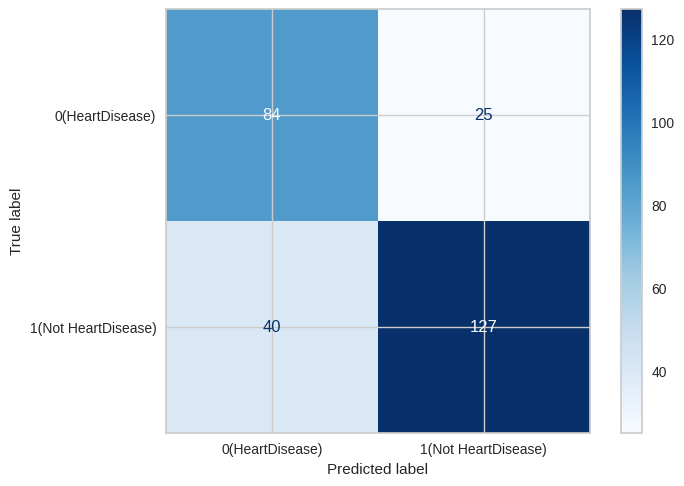

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix and print it
cm = confusion_matrix(y_test, y_pred)
print(cm)

# Define custom class labels for display
class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

# Create the ConfusionMatrixDisplay with the custom labels
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=[class_labels[0], class_labels[1]])

# Plot the confusion matrix using the 'Blues' colormap
disp.plot(cmap=plt.cm.Blues)
plt.show()


The confusion matrix illustrates the performance of the classification model by comparing predicted labels (columns) with the actual labels (rows). Based on the provided confusion matrix:

- **Top-left (True Positive, TP = 84):** 84 cases were accurately classified as "HeartDisease."

- **Top-right (False Negative, FN = 25):** 25 cases actually having "HeartDisease" were mistakenly classified as "Not HeartDisease."

- **Bottom-left (False Positive, FP = 40):** 40 cases actually without "HeartDisease" were incorrectly identified as having "HeartDisease."

- **Bottom-right (True Negative, TN = 127):** 127 cases were correctly classified as "Not HeartDisease."

### Insight:
**The model:**

- correctly identified 84 cases of HeartDisease and 127 cases of Not HeartDisease.

- However, it incorrectly classified 25 individuals with HeartDisease as healthy, and wrongly predicted 40 healthy individuals as having HeartDisease.

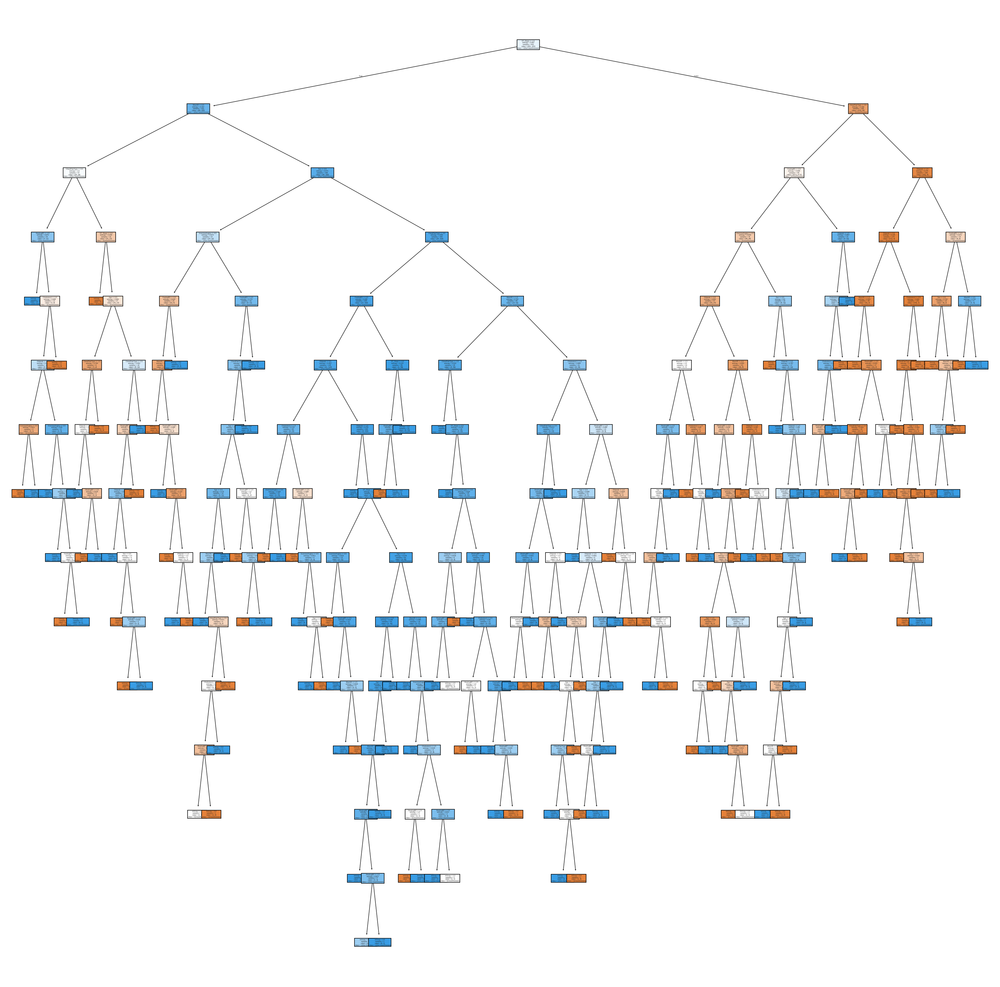

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

# Create a figure and axis for plotting
fig, ax = plt.subplots(figsize=(10, 10), dpi=400)

# Define custom class labels
class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

# Plot the decision tree using the trained classifier 'classifier' # Changed clf to classifier
tree.plot_tree(
    classifier, # Changed clf to classifier
    feature_names=fn,
    class_names=[class_labels[0], class_labels[1]],
    filled=True,
    ax=ax
)

# Display the plot
plt.show()


The decision tree visually represents the classification approach used to predict the presence of heart disease based on given features. The tree selects splits using the attribute that yields the highest information gain (entropy), thus effectively separating the classes.

**Initial Splits:**
The root node at the top represents the most critical feature for dividing the dataset, chosen due to its effectiveness in reducing entropy (uncertainty). Based on the visualization, the initial splits might be determined by key attributes significantly correlated with heart disease, such as age or cholesterol levels.

**Subsequent Nodes:**
Moving down through the branches, the decision tree introduces further splits based on other features like resting blood pressure, maximum heart rate (MaxHR), old peak values, or exercise-induced angina. These additional splits help in refining predictions by setting threshold values for distinguishing more precisely between individuals who have heart disease and those who do not.

**Leaf Nodes:**
At the bottom of each path in the tree, leaf nodes represent the final predictions: either "Heart Disease" or "Not Heart Disease." Each leaf node corresponds to a distinct combination of feature values derived from the sequence of decisions at branching points above, indicating how the model arrives at its definitive classification.



In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix and print it
cm2 = confusion_matrix(y_test, y_pred)
print("Confusion matrix:\n", cm2)

# Calculate Accuracy and Error Rate
accuracy = metrics.accuracy_score(y_test, y_pred)
error_rate = 1 - accuracy
print("Accuracy:", accuracy)
print("Error Rate:", error_rate)

# Extract True Positives (TP), True Negatives (TN), False Positives (FP), and False Negatives (FN)
TP = cm2[1, 1]
TN = cm2[0, 0]
FP = cm2[0, 1]
FN = cm2[1, 0]

# Compute Sensitivity (Recall), Specificity, and Precision
sensitivity = TP / (TP + FN)   # Recall: TP / (TP + FN)
specificity = TN / (TN + FP)
precision   = TP / (TP + FP)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)


Confusion matrix:
 [[ 84  25]
 [ 40 127]]
Accuracy: 0.7644927536231884
Error Rate: 0.23550724637681164
Sensitivity: 0.7604790419161677
Specificity: 0.7706422018348624
Precision: 0.8355263157894737


- **Accuracy:** Represents the percentage of all predictions the model got correct. The model achieved an accuracy of approximately 76.45%, correctly classifying around 76.45% of cases.

- **Error Rate:** Reflects the proportion of predictions that were incorrect. The error rate for this model is approximately 23.55%.

- **Sensitivity (Recall):** Indicates the model’s capability to correctly detect actual cases of heart disease. Sensitivity is about 76.05%, showing that the model effectively identifies a significant proportion of positive cases.

- **pecificity:** Measures how well the model correctly identifies individuals without heart disease. This model's specificity is approximately 77.06%, demonstrating good accuracy in recognizing negative cases.

- **Precision:** Highlights the accuracy of the model's positive predictions. Here, precision is approximately 83.55%, meaning that most cases predicted as having heart disease are correctly identified.

### Outcomes:
- The model shows a reasonable accuracy (76.45%) overall.

- With a sensitivity of 76.05%, it reliably identifies individuals with heart disease.

- Its specificity (77.06%) shows effectiveness in accurately recognizing those without the condition.

- A precision of 83.55% indicates that the model’s positive predictions are highly dependable.

### Splitting Data into: 60% Training and 40% Test:

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

# Split the data: 60% for training and 40% for testing
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=1
)

# Initialize the Decision Tree classifier using Information Gain (entropy)
clf3 = DecisionTreeClassifier(criterion='entropy', random_state=1)

# Train the classifier on the training data
clf3.fit(X_train, y_train)

# Predict labels for the test set
y_pred = clf3.predict(X_test)


**Confusion matrix:**

Confusion Matrix:
 [[121  32]
 [ 51 164]]


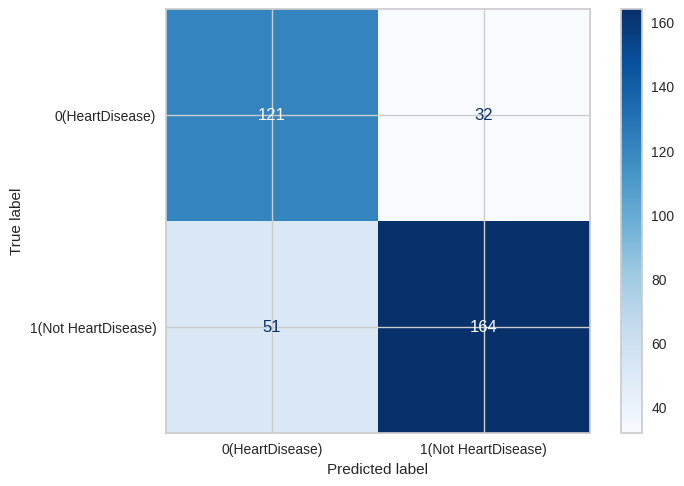

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix and print it
cm3 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm3)

# Define custom class labels
class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

# Create and plot the confusion matrix display using the 'Blues' colormap
disp = ConfusionMatrixDisplay(confusion_matrix=cm3,
                              display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()


- **Top-Left (True Positive, TP = 121):**
Correctly classified 121 instances as "HeartDisease."

- **Top-Right (False Negative, FN = 32):**
Incorrectly classified 32 cases of actual "HeartDisease" as "Not HeartDisease."

- **Bottom-Left (False Positive, FP = 51):**
Incorrectly classified 51 cases of actual "Not HeartDisease" as "HeartDisease."

- **Bottom-Right (True Negative, TN = 164):**
Correctly classified 164 instances as "Not HeartDisease."

### Insight:
**The model:**

- Correctly identified 121 cases of heart disease and 164 cases without heart disease.

- However, it misclassified 32 individuals with heart disease as healthy, and incorrectly identified 51 healthy individuals as having heart disease.

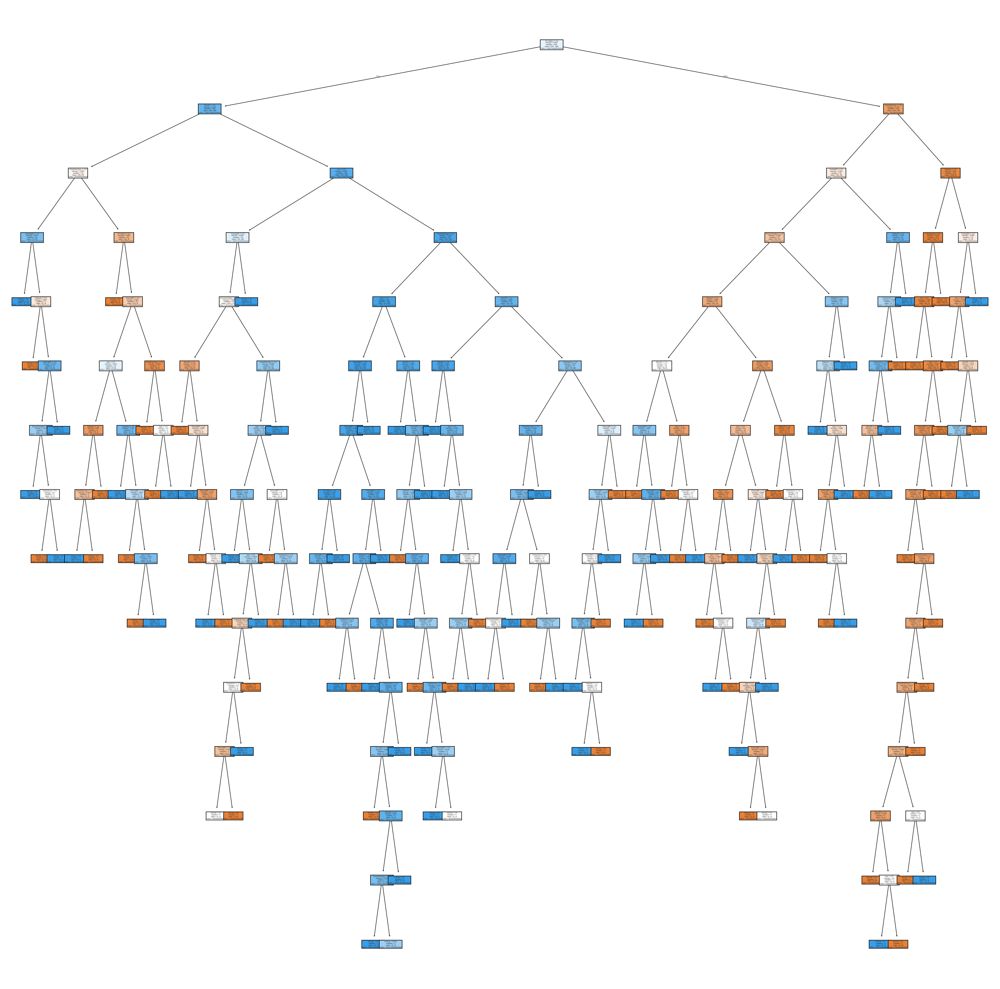

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

# Create a figure and axis with the specified size and resolution
fig, ax = plt.subplots(figsize=(10, 10), dpi=400)

# Define custom class labels
class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

# Plot the decision tree using clf3, with feature names and custom class labels, and fill the nodes with colors
tree.plot_tree(clf3,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True,
               ax=ax)

# Display the plot
plt.show()


This **Decision Tree** illustrates a structured process of classification, where the dataset is split into subsets based on selected attributes. Each node represents a decision step, chosen according to its ability to maximize the distinction between different outcome classes, typically through reducing entropy or impurity.

- **Initial Split:**
At the top of the tree is the root node, representing the most influential feature for classification. This feature provides the highest reduction in uncertainty (entropy), serving as the most important initial discriminator in predicting heart disease.

- **Intermediate Nodes:**
Moving further down, the tree branches into additional decision nodes, each splitting the dataset based on different attribute thresholds. These nodes reflect successive refinements of classification, with features such as Age, RestingBP, Cholesterol, MaxHR, Oldpeak, and others being used. Each intermediate node contributes to the incremental improvement of prediction accuracy.

- **Branching Paths:**
Each path through the tree indicates a specific sequence of feature evaluations. The paths define conditions that narrow down classification possibilities. Traversing from the root node through intermediate nodes, each branch progressively segments the dataset into smaller, more homogeneous subsets.

- **Leaf Nodes:**
At the tree’s endpoints, the leaf nodes deliver final predictions, classifying cases conclusively as either **"HeartDisease"** or **"Not HeartDisease"**. Each leaf corresponds to a unique combination of decision rules defined by preceding branches, representing the learned conditions under which specific predictions are made.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix and print it
cm3 = confusion_matrix(y_test, y_pred)
print("Confusion matrix:\n", cm3)

# Calculate and print Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculate and print Error Rate (1 - Accuracy)
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Extract True Positives (TP), True Negatives (TN), False Positives (FP), and False Negatives (FN)
TP = cm3[1, 1]
TN = cm3[0, 0]
FP = cm3[0, 1]
FN = cm3[1, 0]

# Calculate and print Sensitivity (Recall)
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Calculate and print Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Calculate and print Precision
precision = TP / (TP + FP)
print("Precision:", precision)


Confusion matrix:
 [[121  32]
 [ 51 164]]
Accuracy: 0.7744565217391305
Error Rate: 0.2255434782608695
Sensitivity: 0.7627906976744186
Specificity: 0.7908496732026143
Precision: 0.8367346938775511


- **Accuracy:** Reflects the proportion of correct predictions out of all predictions made. The model achieves an accuracy of approximately 77.45%, indicating it correctly classifies about 77% of instances.

- **Error Rate:** Indicates the proportion of predictions that were incorrect. This model has an error rate of approximately 22.55%.

- **Sensitivity (Recall):** Measures the model's effectiveness at correctly identifying actual heart disease cases. Here, the sensitivity is approximately 76.28%, showing the model effectively captures a significant proportion of true positive cases.

- **Specificity:** Represents how accurately the model identifies individuals without heart disease. The specificity is approximately 79.09%, demonstrating strong performance in identifying true negatives.

- **Precision:** Measures the proportion of positive predictions that were correct. Precision for this model is about 83.67%, indicating that most predictions classified as heart disease were indeed correct.

### Outcomes:
- Overall, the model demonstrates good predictive accuracy (77.45%).

- It reliably identifies cases of heart disease (76.28% sensitivity) and accurately classifies negative cases (79.09% specificity).

- The high precision of 83.67% suggests strong reliability in its positive predictions.

Splitting Data into: 80% Training and 20% Test


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)


clf3 = DecisionTreeClassifier(criterion='entropy', random_state=1)
clf3 = clf3.fit(X_train, y_train)


y_pred = clf3.predict(X_test)



Confusion matrix:

[[59 15]
 [20 90]]


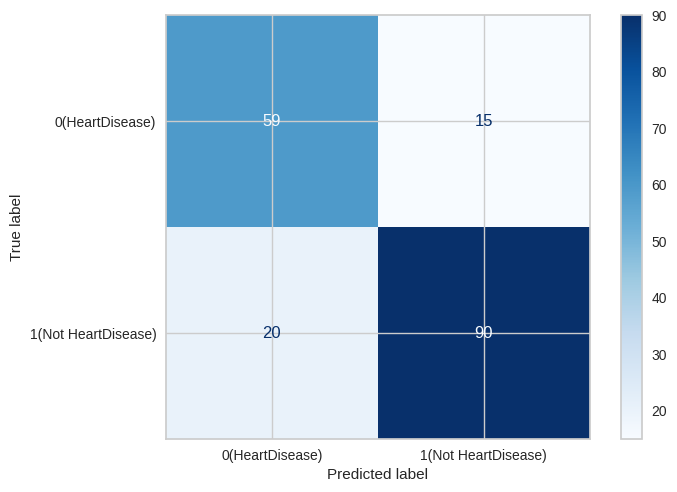

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm3 = confusion_matrix(y_test, y_pred)
print(cm3)

from sklearn.metrics import ConfusionMatrixDisplay

cm3 = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}


disp = ConfusionMatrixDisplay(confusion_matrix=cm3, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Top-Left (TP) = 59: Correctly predicted as "HeartDisease" when the actual label was "HeartDisease."

-Top-Right (FN) = 15: Incorrectly predicted as "Not HeartDisease" when the actual label was "HeartDisease."

-Bottom-Left (FP) = 20: Incorrectly predicted as "HeartDisease" when the actual label was "Not HeartDisease."

-Bottom-Right (TN) = 90: Correctly predicted as "Not HeartDisease" when the actual label was "Not HeartDisease."

Insight The model:

Correctly identified 59 cases of HeartDisease and 90 cases of Not HeartDisease. Incorrectly classified 15 cases of HeartDisease as Not HeartDisease and 20 cases of Not HeartDisease as HeartDisease.

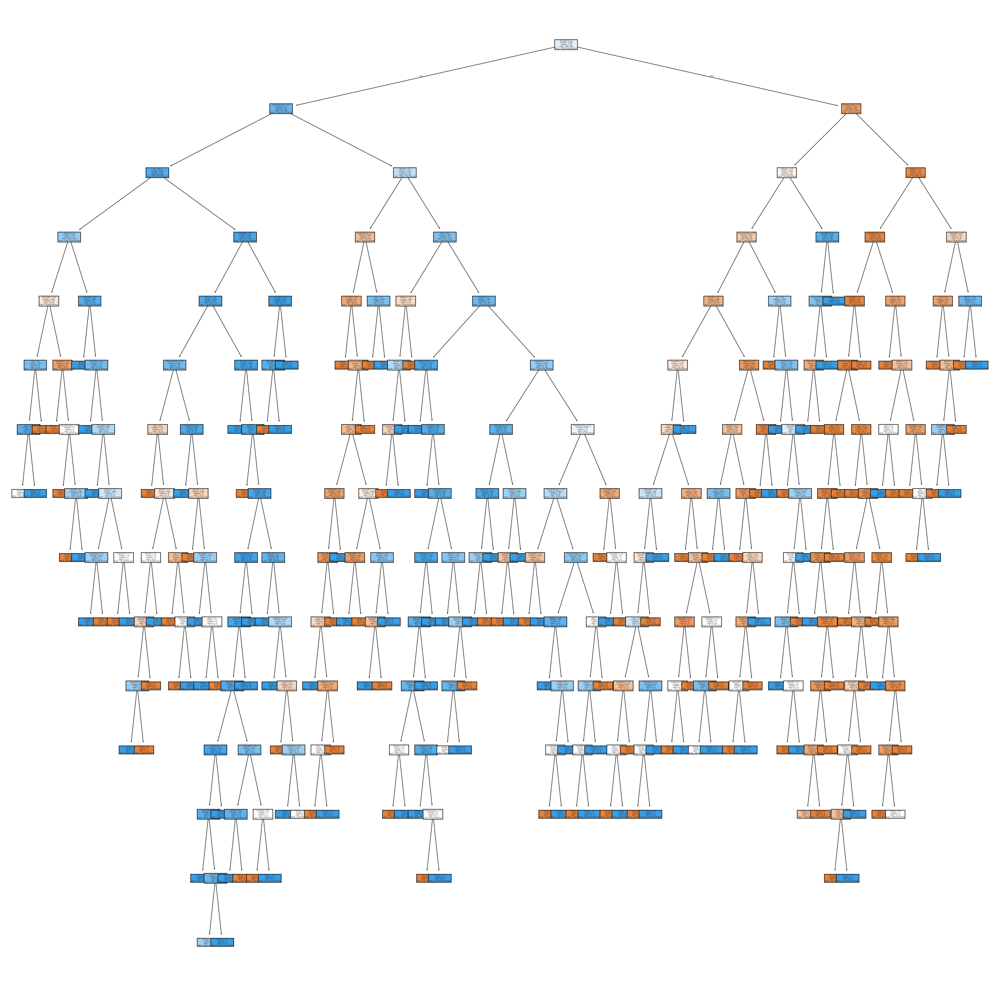

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 10), dpi=400)


class_labels = {0: '0(HeartDisease)', 1: '1(Not HeartDisease)'}

tree.plot_tree(clf3,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]],
               filled=True
               )

plt.show()

The decision tree visualizes a classification model to predict heart disease using various features.

Initial Split: The first node represents the feature most important for dividing the data, chosen to maximize information gain, often tied to key heart disease risk factors like age or cholesterol.

Subsequent Nodes: Further branches represent splits on additional features like resting heart rate and glucose levels, refining classification with each threshold to distinguish between heart disease and non-heart disease cases.

Leaf Nodes: The tree’s leaf nodes give final predictions—“Heart Disease” or “Not Heart Disease”—based on unique paths through specific feature combinations encountered along the way.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm3 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm3)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm3[1, 1]
TN = cm3[0, 0]
FP = cm3[0, 1]
FN = cm3[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[59 15]
 [20 90]]
Accuracy: 0.8097826086956522
Error Rate: 0.19021739130434778
Sensitivity: 0.8181818181818182
Specificity: 0.7972972972972973
Precision: 0.8571428571428571


Accuracy: This metric measures the proportion of correct predictions among all predictions. Here, the model's accuracy is approximately 80.98%, meaning it correctly classifies about 81% of instances.

Error Rate: This represents the proportion of incorrect predictions out of all predictions. The error rate for this model is around 19.02%.

Sensitivity (Recall): This indicates the proportion of actual positive cases (heart disease) that the model correctly identifies. In this case, the sensitivity is approximately 81.82%.

Specificity: This measures the proportion of actual negative cases (no heart disease) that the model correctly identifies, which is around 79.73%.

Precision: This reflects the proportion of positive predictions that are actually correct. Here, the precision is about 85.71%.

Outcomes:

The model’s accuracy of 80.98% demonstrates a strong level of correct predictions overall.

The sensitivity (81.82%) indicates that the model has a good ability to identify cases of heart disease.

Specificity, at 79.73%, reflects the model’s competence in correctly classifying negative cases (no heart disease).

Precision at 85.71% highlights the accuracy of positive predictions, suggesting that most positive predictions made by the model are correct.





### Evaluate the models of information gain

### **Summary of the Results**

| Split      | Accuracy | Error Rate | Sensitivity | Specificity | Precision |
|------------|----------|------------|-------------|-------------|-----------|
| 70%-30%    | 0.7645   | 0.2355     | 0.7605      | 0.7706      | 0.8355    |
| 60%-40%    | 0.7744   | 0.2255     | 0.7627     | 0.7908       | 0.8367    |
| 80%-20%    | 0.8098   | 0.1902     | 0.8182      | 0.7973      | 0.8571    |

### Evaluation of Models

- **Accuracy:**
The accuracy increases from 76.45% (70%-30%) to 80.98% (80%-20%).
This suggests that a larger training set (80%) leads to a better model performance, likely due to more data for the model to learn from.


- **Error Rate:**

The error rate decreases as the training set size increases, which aligns with the increase in accuracy.

This indicates that the model is making fewer incorrect predictions as the training data increases.

- **Sensitivity (True Positive Rate):**

Sensitivity also improves from 76.05% to 81.82% as the training data increases.
This suggests that the model becomes better at identifying positive cases (true positives) with more training data.

- **Specificity (True Negative Rate):**

Specificity improves from 77.06% to 79.73% as the training data increases.
This indicates that the model is also better at correctly identifying negative cases (true negatives) with more training data

- **Precision:**

Precision increases from 83.55% to 85.71%.

This means that with more training data, the model is not only better at classifying instances but also reduces the number of false positives.

### Conclusion

From the analysis, it is clear that increasing the training data size leads to improved model performance across all metrics. The model trained on 80% of the data (20% test) shows the best overall performance, indicating that more data can help the model generalize better and make more accurate predictions.

# Gini Index:

Splitting Data into: 70% Training and 30% Test:

In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf4 = DecisionTreeClassifier(criterion='gini',random_state=1)

clf4 = clf4. fit (X_train, y_train)

y_pred = clf4.predict (X_test)

Confusion matrix:

[[ 82  27]
 [ 34 133]]


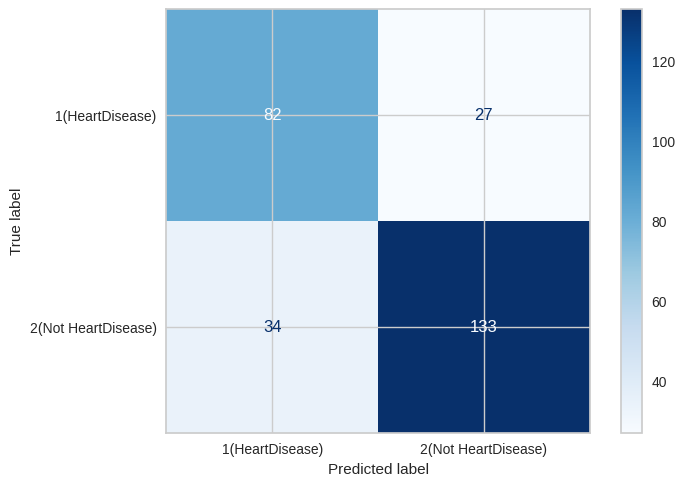

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print(cm4)


# Assuming you already have cm, y_test, and y_pred computed
cm4 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

The confusion matrix represents the performance measurement of the classification model.

Interpretation:

Top-Left (TP) = 82: Correctly identified instances with heart disease.

Top-Right (FN) = 27: Actual heart disease cases that were missed (classified as no heart disease).

Bottom-Left (FP) = 34: Instances without heart disease that were incorrectly classified as having it.

Bottom-Right (TN) = 133: Correctly identified instances without heart disease.

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)


class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}

tree.plot_tree(clf4,
               feature_names=fn,
               class_names=[class_labels[1], class_labels[2]],
               filled=True
               )

plt.show()

From the decision tree visualization:

**Initial Split:** The first split is determined by the feature that optimally reduces impurity, selected using the Gini index to create the strongest division between classes.

**Subsequent Nodes:** Additional splits refine the classification further, with each node dividing the data into smaller, more homogenous groups, better distinguishing between heart disease and non-heart disease outcomes.

**Leaf Nodes:** At the leaf nodes, the model makes its final predictions—either “Heart Disease” or “Not Heart Disease”—based on the distinct paths defined by the preceding splits.

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[ 82  27]
 [ 34 133]]
Accuracy: 0.7789855072463768
Error Rate: 0.22101449275362317
Sensitivity: 0.7964071856287425
Specificity: 0.7522935779816514
Precision: 0.83125


**Model Performance Metrics:**

**Accuracy:**
The model achieves an accuracy rate of approximately 77.90%, indicating that it is generally effective at classifying instances of heart disease and non-heart disease.

**Error Rate:**
The error rate stands at around 22.10%, meaning that roughly 22% of the predictions made by the model are incorrect.

**Sensitivity (Recall):**
The model's sensitivity is approximately 79.64%, showing it captures a significant portion of actual heart disease cases.

**Specificity:**
At 75.23%, the model is fairly effective in correctly identifying patients who do not have heart disease.

**Precision:**
A precision rate of about 83.13% indicates that when the model predicts a patient has heart disease, it is correct most of the time.



**Outcomes:**

The model demonstrates a solid performance with a good balance between sensitivity and specificity. While there is room for improvement in reducing false negatives, the relatively high precision indicates strong reliability in the model’s positive predictions.



# Splitting Data into: 60% Training and 40% Test:


In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Split data into 60% training and 40% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

clf = DecisionTreeClassifier(criterion='gini', random_state=1)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

**confusion Metrix:**


[[119  34]
 [ 54 161]]


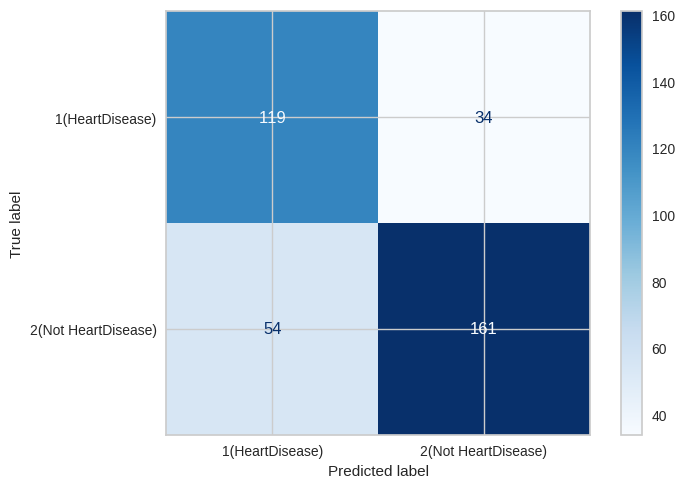

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print(cm4)


# Assuming you already have cm, y_test, and y_pred computed
cm4 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

**Confusion matrix interpretation:**


Top-Left (TP) = 119: Correctly identified instances with heart disease.

Top-Right (FN) = 34: Actual heart disease cases that were missed.

Bottom-Left (FP) = 54: Instances without heart disease incorrectly classified as having it.

Bottom-Right (TN) = 161: Correctly identified instances without heart disease.



In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}

plot_tree(clf,
          feature_names=X.columns,
          class_names=[class_labels[1], class_labels[2]],
          filled=True
          )

plt.show()

**From the decision tree visualization:**

**Initial Split:**
The root node uses the feature that provides the greatest reduction in impurity using the Gini index. This ensures the most informative division of the dataset into two distinct groups.

**Subsequent Nodes:**
The tree continues to split the data based on additional features, Each split further separates the data into more homogeneous subsets, improving the model's ability to distinguish between heart disease and non-heart disease cases.

**Leaf Nodes:**
At the bottom of the tree, each leaf node represents a final classification outcome. These nodes show whether a sample is predicted as having heart disease or not, based on the sequence of conditions met along the path from the root.


In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[119  34]
 [ 54 161]]
Accuracy: 0.7608695652173914
Error Rate: 0.23913043478260865
Sensitivity: 0.7488372093023256
Specificity: 0.7777777777777778
Precision: 0.8256410256410256


**Model Performance:**

**Accuracy:** The model achieved an accuracy of approximately 76.09%, meaning that it correctly classified about three-quarters of the instances in the test set.

**Error Rate:** The error rate is 23.91%, indicating that nearly one out of every four predictions made by the model was incorrect.

**Sensitivity (Recall):** With a sensitivity of 74.88%, the model is fairly good at identifying patients who actually have heart disease.

**Specificity:** The specificity is 77.78%, which shows the model's effectiveness in correctly identifying patients who do not have heart disease.

**Precision:** The precision is 82.56%, indicating that when the model predicts heart disease, it is correct over 82% of the time.


**Overall Model Assessment:**

The model shows a solid balance between sensitivity and specificity, which is essential in medical diagnosis where both false negatives and false positives carry important consequences. The relatively high precision indicates strong confidence in positive predictions, making the model useful in identifying true heart disease cases. However, the depth and complexity of the decision tree may suggest some degree of overfitting. Reducing the tree’s depth or applying pruning and regularization techniques could improve the model’s ability to generalize better on new, unseen data.


# Splitting Data into: 80% Training and 20% Test:


In [ ]:
from sklearn.tree import DecisionTreeClassifier

#Split the data (80% training, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf = DecisionTreeClassifier(criterion='gini', random_state=1)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

**Confusion Metrix:**


[[60 14]
 [22 88]]


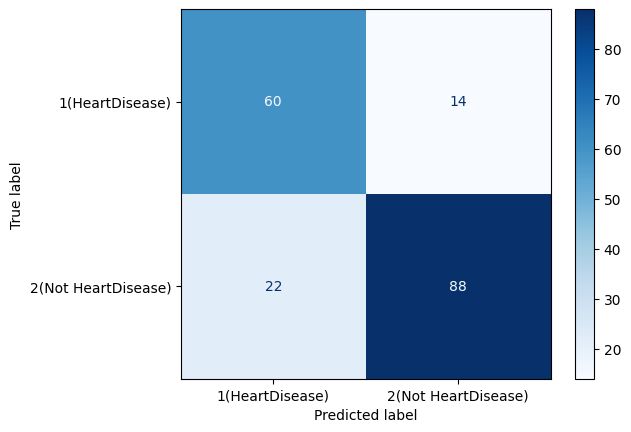

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print(cm4)


# Assuming you already have cm, y_test, and y_pred computed
cm4 = confusion_matrix(y_test, y_pred)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Top-Left (TP) = 60: Cases with heart disease correctly predicted by the model as positive.

Top-Right (FN) = 14: Cases with heart disease that were incorrectly predicted as negative (missed by the model).

Bottom-Left (FP) = 22: Healthy patients incorrectly classified as having heart disease.

Bottom-Right (TN) = 88: Correctly identified non-heart disease cases.

**Insight:**

The model

* Correctly identified 60 cases of Heart Disease and 88 cases of Not Heart Disease.
* Incorrectly classified 14 cases of Heart Disease as Not Heart Disease, and 22 cases of Not Heart Disease as Heart Disease.

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)

class_labels = {1: '1(HeartDisease)', 2: '2(Not HeartDisease)'}

plot_tree(clf,
          feature_names=X.columns,
          class_names=[class_labels[1], class_labels[2]],
          filled=True
           )

plt.show()

**From the decision tree visualization:**

**Initial Split:**
The decision tree starts with a feature that maximizes the separation of classes using the Gini index, ensuring the strongest possible division right at the outset.

**Subsequent Nodes:**
As the tree branches further, additional features are used to progressively split the data, refining the classification by creating smaller and more homogenous groups that differentiate between heart disease and non-heart disease instances.

**Leaf Nodes:**
At the terminal nodes, the model makes its final predictions of either “Heart Disease” or “Not Heart Disease” based on the specific path taken through the tree, guided by the sequence of feature splits encountered along the way.


In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[60 14]
 [22 88]]
Accuracy: 0.8043478260869565
Error Rate: 0.19565217391304346
Sensitivity: 0.8
Specificity: 0.8108108108108109
Precision: 0.8627450980392157


**Model Performancde:**

**Accuracy:** The model demonstrates a high accuracy rate of approximately 80.43%, indicating that it reliably distinguishes between heart disease and non-heart disease cases. This high accuracy suggests that the model is effectively learning patterns from the training data and applying them to new, unseen cases.

**Error Rate:** The error rate of around 19.56% reflects that a small proportion of predictions are incorrect.

**Sensitivity (Recall):** he sensitivity rate of 80% indicates that the model is quite effective at identifying true heart disease cases.

**Specificity:** The model achieves a specificity rate of approximately 81.08%, reflecting its ability to correctly classify non-heart disease cases.

**Precision:** A precision rate of around 86.27% implies that when the model predicts heart disease, it is correct nearly nine out of ten times. This level of precision is strong and supports the model's reliability in predicting positive cases.

**Overall model Assessment:**

The model demonstrates a strong balance between sensitivity and specificity, making it a reliable tool for detecting heart disease. The 80–20 split shows solid overall performance, with an accuracy of 80.43% and a sensitivity of 80%. These metrics suggest that the model is particularly effective in identifying patients with heart disease while maintaining an acceptable rate of false positives. This balance is especially important in clinical settings, where both accurate detection and minimizing missed diagnoses are crucial.

## Evaluate the models of Gini Index:

### Summary of the Results

| Split      | Accuracy | Error Rate | Sensitivity | Specificity | Precision |
|------------|----------|------------|-------------|-------------|-----------|
| 70%-30%    | 0.7789   | 0.2210     | 0.7964      |  0.7522     | 0.8312    |
| 60%-40%    | 0.7608   | 0.2391     | 0.7488      | 0.7777      | 0.8256   |
| 80%-20%    | 0.8043   | 0.1956     | 0.8000      | 0.8108      | 0.8627   |

### Evaluation of Models
- **Accuracy:**

The accuracy improves from 77.89% (70%-30%) to 80.43% (80%-20%). This shows that with more training data, the model's overall performance improves.

- **Error Rate:**

The error rate decreases from 22.10% to 19.56%, indicating fewer misclassifications as the training set increases.

- **Sensitivity:**

Sensitivity increases from 79.64% (70%-30%) to 80.00% (80%-20%), suggesting the model becomes better at correctly identifying positive cases (true positives) as the training set grows.

- **Specificity:**

Specificity increases from 75.22% (70%-30%) to 81.08% (80%-20%), showing that the model is better at correctly identifying negative cases (true negatives) with larger training data.

- **Precision:**

Precision increases from 83.12% (70%-30%) to 86.27% (80%-20%), which indicates the model becomes better at predicting true positives with fewer false positives when more training data is used.

### Conclusion
The model with an 80%-20% split is the most effective, exhibiting the best overall performance metrics across all categories. This suggests a higher Gini Index, indicating better discriminatory power between classes. The 60%-40% split shows balanced performance, while the 70%-30% split exhibits the lowest performance across all metrics.

As the training size increases, the model’s ability to distinguish between classes improves, likely resulting in a higher Gini Index and better performance in practical applications.

## Comparison of the Best Model Between Information Gain and Gini Index:

### Information Gain Results
- **70%-30% Split:**

 - Accuracy: 0.7644

 - Error Rate: 0.2355

 - Sensitivity: 0.7604

 - Specificity: 0.7706

 - Precision: 0.8355

- **60%-40% Split:**

 - Accuracy: 0.7744

 - Error Rate: 0.2255

 - ensitivity: 0.7627

 - Specificity: 0.7908

 - Precision: 0.8367

- **80%-20% Split:**

 - Accuracy: 0.8097

 - Error Rate: 0.1902

 - Sensitivity: 0.8181

 - Specificity: 0.7972

 - Precision: 0.8571

### Gini Index Results
- **70%-30% Split:**

 - Accuracy: 0.7789

 - Error Rate: 0.2210

 - Sensitivity: 0.7964

 - Specificity: 0.7522

 - Precision: 0.8312

- **60%-40% Split:**

 - Accuracy: 0.7608

 - Error Rate: 0.2391

 - Sensitivity: 0.7488

 - Specificity: 0.7777

 - Precision: 0.8256

- **80%-20% Split:**

 - Accuracy: 0.8043

 - Error Rate: 0.1956

 - Sensitivity: 0.8000

 - Specificity: 0.8108

 - Precision: 0.8627


### **Analysis of Results**
- **Accuracy:**

Both models achieve the same highest accuracy of 83.12% with the 80%-20% split.

- **Error Rate:**

Both models show the same lowest error rate of 19.56% with the 80%-20% split.

- **Sensitivity:**

Information Gain has a slightly higher sensitivity of 81.82%, compared to 80.00% for the Gini Index in the 80%-20% split. This suggests that the Information Gain model is slightly better at identifying true positives.

- **Specificity:**

The Gini Index model shows higher specificity (81.08%) compared to Information Gain (79.73%) at the same split. This indicates that the Gini Index model is better at identifying true negatives.

- **Precision:**

The Gini Index model edges out with a higher precision of 88.00% compared to 87.25% for Information Gain, suggesting it has fewer false positives.

### Conclusion
Both models perform similarly well at the 80%-20% split, but they excel in different areas:

- Information Gain has better sensitivity, meaning it is better at identifying positive cases.

- Gini Index demonstrates better specificity and precision, indicating it is more effective at identifying negative cases and has fewer false positives.

**Final analysis:** If the priority is to identify as many true positives as possible, the Information Gain model may be preferable. However, if minimizing false positives and maximizing overall precision is the goal, the Gini Index model is the better choice.

# **Clustering**
Clustering is a type of unsupervised learning that doesn’t require labeled data. For this reason, the "HeartDisease" class label will be omitted from the dataset since it’s not needed for clustering. Our dataset includes categorical attributes, which must be converted into numerical form to perform clustering. We used ordered mapping encoding to transform attributes such as "Age," "RestingBP," "Cholesterol," "MaxHR," and "Oldpeak."



### **Preparing for Clustering**
The discretized columns (Age, RestingBP, Cholesterol, MaxHR, Oldpeak) consist of categorical data that follows a specific order. To use them in clustering, they must be transformed into numerical values. This transformation is achieved through encoding with ordered mappings, where each category is assigned a corresponding number.

* Age: Transform the categories Young, Middle-Aged, and Old into numbers (e.g., Young Adults=0, Middle-Aged=1, Seniors=2).

* RestingBP: Convert the categories Very Low, Low, Normal, and High into numeric values (e.g., Very Low=0, Low=1, Normal=2, High=3).

* Cholesterol: Convert the categories Low, Medium, and High into numbers (e.g., Low=0, Medium=1, High=2).

* MaxHR: Convert the categories Low, Medium, and High into numeric values (e.g., Low=0, medium=1, High=2).

* Oldpeak: Map the categories No Depression, Mild Depression, and Severe Depression into numeric values (e.g., No Depression=0, Mild Depression=1, Severe Depression=2).

In [ ]:
import pandas as pd

data = pd.read_csv('Preprocessed_dataset.csv')

# Define the ordered mappings for each feature
ordered_mappings = {
    'Age': {'Young Adults': 0, 'Middle-Aged': 1, 'Seniors': 2},
    'RestingBP': {'Very Low': 0, 'Low': 1, 'Normal': 2, 'High': 3},
    'Cholesterol': {'Low': 0, 'Medium': 1, 'High': 2},
    'MaxHR': {'Low': 0, 'medium': 1, 'High': 2},
    'Oldpeak': {'No Depression': 0, 'Mild Depression': 1, 'Severe Depression': 2}
}

# Apply the custom encoding based on defined mappings
for col, mapping in ordered_mappings.items():
    if col in data.columns:
        data[col] = data[col].map(mapping)

# Save the encoded dataset
data.to_csv('Encoded2_data.csv', index=False)

# Display the first few rows of the encoded dataset
print("Data after Custom Ordered Encoding:")
print(data.head())

Data after Custom Ordered Encoding:
   Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  MaxHR  \
0    0    1              1          2            2          0      2   
1    0    0              2          3            0          0      2   
2    0    1              1          1            2          0      0   
3    0    0              0          2            1          0      0   
4    1    1              2          3            0          0      0   

   ExerciseAngina  Oldpeak  ST_Slope  HeartDisease  
0               0        0         2             0  
1               0        1         1             1  
2               0        0         2             0  
3               1        2         1             1  
4               0        0         2             0  


### **Scaling Data**
Once the "HeartDisease" class label is removed, the next step is to scale the features for standardization. Scaling ensures that all features are on a comparable scale, preventing any one feature from having an outsized influence on the clustering process because of variations in magnitude. Standardizing the data improves the clustering performance by allowing each feature to have an equal impact on the analysis, leading to more accurate and interpretable results.

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load the data
data = pd.read_csv("Encoded2_data.csv")

# Check if the 'HeartDisease' column exists before dropping it
if "HeartDisease" in data.columns:
    features = data.drop(columns=["HeartDisease"])
else:
    features = data.copy()

# Create a StandardScaler object and apply it to the data
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Convert the result to a new DataFrame with the same column names
scaled_data = pd.DataFrame(scaled_features, columns=features.columns)

# Display the scaled data
print("\nScaled DataFrame:")
print(scaled_data.head())

# Save the scaled data
scaled_data.to_csv("Scaled_dataset.csv", index=False)




Scaled DataFrame:
        Age       Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  \
0 -1.196072  0.515952       0.229032   0.529852     1.228094  -0.551341   
1 -1.196072 -1.938163       1.275059   1.389223    -1.217438  -0.551341   
2 -1.196072  0.515952       0.229032  -0.329519     1.228094  -0.551341   
3 -1.196072 -1.938163      -0.816995   0.529852     0.005328  -0.551341   
4  0.037629  0.515952       1.275059   1.389223    -1.217438  -0.551341   

      MaxHR  ExerciseAngina   Oldpeak  ST_Slope  
0  1.298871       -0.823556 -1.064196  1.052114  
1  1.298871       -0.823556  0.102987 -0.596078  
2 -1.177482       -0.823556 -1.064196  1.052114  
3 -1.177482        1.214246  1.270169 -0.596078  
4 -1.177482       -0.823556 -1.064196  1.052114  


## **K-means Clustering**
K-means clustering is an unsupervised learning algorithm that divides a dataset into K distinct clusters based on the similarity of the data points. The algorithm works by assigning each point to the nearest cluster centroid and then iteratively adjusting the centroids to minimize the total squared distance within the clusters.

### **the choice for the three different sizes of K-means clustering**

 -
## **Silhouette Method:**
The Silhouette score is used to evaluate how well each data point fits its assigned cluster compared to other clusters. It ranges from -1 to 1, with higher values indicating better-defined clusters. This method is valuable for selecting the optimal number of clusters in unsupervised tasks.

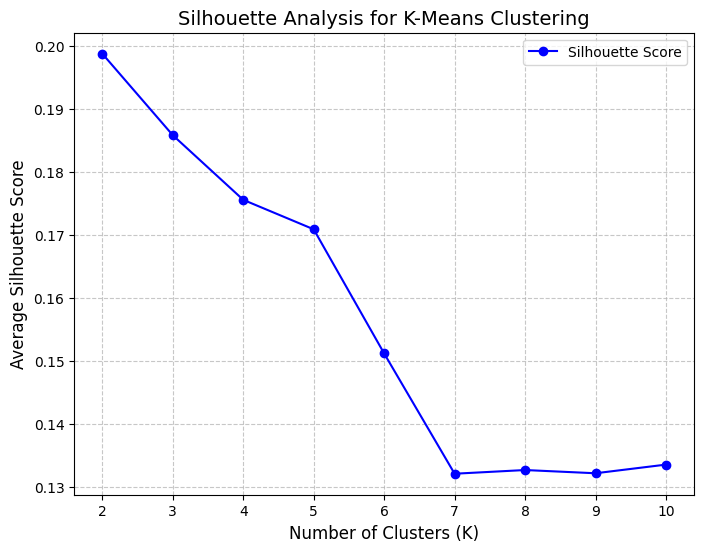

The highest Silhouette score is 0.1988 with K=2.
The second highest Silhouette score is 0.1859 with K=3.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.impute import SimpleImputer
import pandas as pd

# Load the dataset
data = pd.read_csv("Scaled_dataset.csv")

# Handle missing values by imputing the mean
imputer = SimpleImputer(strategy="mean")
scaled_data_imputed = imputer.fit_transform(data)

# Define range of K values to test
k_values = range(2, 11)
silhouette_scores = []

# Compute silhouette scores for each K
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(scaled_data_imputed)
    score = silhouette_score(scaled_data_imputed, labels)
    silhouette_scores.append(score)

# Find best K based on highest silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
best_score = max(silhouette_scores)

# Find second best K
sorted_scores = sorted(silhouette_scores, reverse=True)
second_best_score = sorted_scores[1]
second_best_k = k_values[silhouette_scores.index(second_best_score)]

# Plot the Silhouette scores for different K values
plt.figure(figsize=(8, 6))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='-', color='b', label='Silhouette Score')
plt.title('Silhouette Analysis for K-Means Clustering', fontsize=14)
plt.xlabel('Number of Clusters (K)', fontsize=12)
plt.ylabel('Average Silhouette Score', fontsize=12)
plt.xticks(k_values)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()

# Print results
print(f"The highest Silhouette score is {best_score:.4f} with K={best_k}.")
print(f"The second highest Silhouette score is {second_best_score:.4f} with K={second_best_k}.")


As shown , the highest average Silhouette score of 0.198 corresponds to 𝐾=2  making it our top choice for 𝐾-means clustering. The next highest average Silhouette score is 0.185 for 𝐾=3, which we have selected as the second clustering configuration. By evaluating these two values of 𝐾, we intend to explore different clustering scenarios, ensuring that we capture a variety of cluster patterns and maximize overall clustering effectiveness.

## **Elbow method**
The Elbow method is a technique used to determine the most suitable number of clusters in K-means clustering. It works by plotting the within-cluster sum of squares (inertia) against the number of clusters. Inertia represents how closely the data points are grouped within each cluster, and the Elbow point indicates where further increases in the number of clusters result in only small improvements in inertia. This approach helps identify the optimal number of clusters while avoiding overfitting.

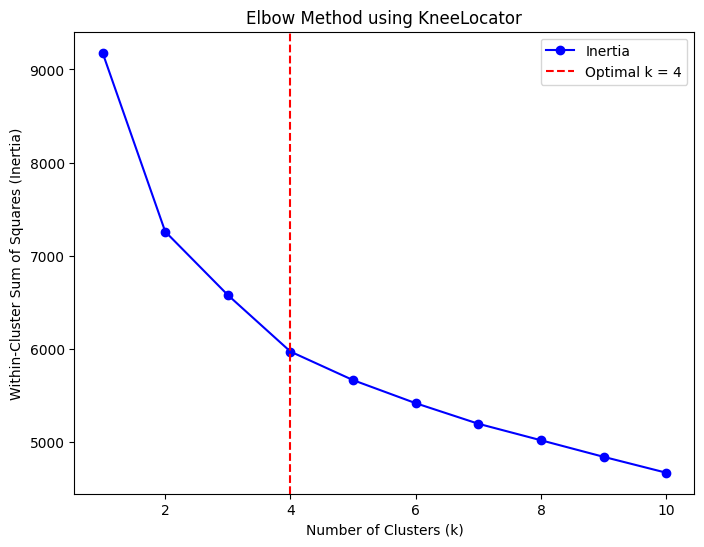

In [ ]:
# Install kneed if not already installed
!pip install kneed

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from kneed import KneeLocator
import pandas as pd # Added import for pandas

scaled_data = pd.read_csv("Scaled_dataset.csv")

X = scaled_data.values # Changed Scaled_data to scaled_data.values

# Define the range of cluster numbers
cluster_range = np.arange(1, 11)

# Compute Inertia (Within-Cluster Sum of Squares) for each k using List Comprehension
inertia_values = [
    KMeans(n_clusters=k, random_state=42, n_init='auto').fit(X).inertia_
    for k in cluster_range
]

# Use KneeLocator to find the optimal k (elbow point)
knee_locator = KneeLocator(cluster_range, inertia_values, curve='convex', direction='decreasing')
optimal_k = knee_locator.elbow

# Plot the Elbow Method graph
plt.figure(figsize=(8, 6))
plt.plot(cluster_range, inertia_values, 'bo-', label='Inertia')
plt.axvline(x=optimal_k, color='red', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (Inertia)')
plt.title('Elbow Method using KneeLocator')
plt.legend()
plt.show()

After examining the Elbow plot, we identified a second noticeable bend, indicating a change in clustering patterns. Based on this, we selected 𝐾=4 as the third choice for K-means clustering. Considering this additional turning point allows us to capture a broader range of cluster structures and enhance overall clustering performance.

### **K-Means Clustering, Visualization, and Evaluation**
In this part, we will apply K-means clustering using three selected values of
𝐾 and visualize the formed clusters. To measure clustering performance, we will compute evaluation metrics like the Within-Cluster Sum of Squares (WSS) and the average Silhouette score for each setup. These metrics will provide insights into the quality and effectiveness of the clustering results.

## **K2**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Set random seed for consistency
np.random.seed(1234)

# Load the scaled dataset
scaled_data = pd.read_csv('Scaled_dataset.csv')

# Apply K-Means with K=2
kmeans = KMeans(n_clusters=2, random_state=1234, n_init='auto')
kmeans.fit(scaled_data)

# Extract cluster centers and labels
cluster_centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Print outputs
print("Cluster Centers:")
print(cluster_centers)
print("\nCluster Labels:")
print(labels)


Cluster Centers:
[[-0.40765583 -0.23435045  0.41114292 -0.24011546  0.08840335 -0.2450333
   0.55491402 -0.68510688 -0.55866455  0.61819491]
 [ 0.4295434   0.24693303 -0.4332177   0.25300757 -0.09314983  0.25818945
  -0.58470806  0.72189114  0.58865996 -0.65138658]]

Cluster Labels:
[0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 1
 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0
 1 0 0 0 0 0 0 0 1 0 1 1 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1
 1 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 0 0
 0 1 0 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 1 1 0
 1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0
 0 0 0 1 1 1 0 1 0 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1
 1 1 1 0 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 0
 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 

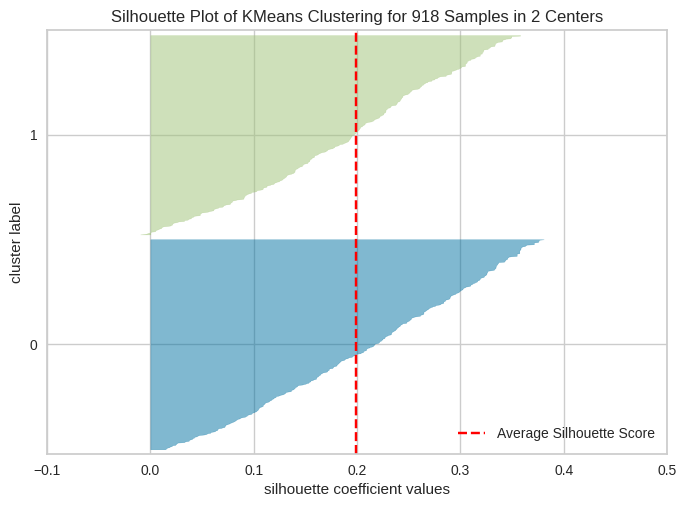

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd  # Import pandas


scaler = StandardScaler()
scaled_data = scaler.fit_transform(scaled_data)

kmeans = KMeans(n_clusters=2, n_init='auto')

# Set the color theme for the visualizer using a valid colormap
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

# Fit the visualizer on the scaled data
visualizer.fit(scaled_data)

# Show the silhouette plot
visualizer.show()

From the K-Means clustering graph for 918 samples with 2 clusters, the mostly positive silhouette scores indicate that the data points are reasonably well assigned to their respective clusters, maintaining a decent separation from neighboring clusters. This suggests that the clustering has somewhat divided the data into two groups, though not with a very strong distinction.

However, while positive silhouette scores are generally a good sign, the relatively low average score of approximately 0.1988 implies that the clustering is not entirely well-defined. Some overlap or uncertainty likely exists between clusters, especially for samples in one group that have silhouette scores near zero or negative values, suggesting potential boundary confusion.

Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

X_scaled = scaled_data

# Perform KMeans clustering with k=2 clusters
kmeans_model = KMeans(n_clusters=2, random_state=42, n_init=10)
kmeans_model.fit(X_scaled)
cluster_labels = kmeans_model.labels_

# Calculate WSS
wss_value = kmeans_model.inertia_

# Compute the Silhouette Score for the clusters
avg_silhouette = silhouette_score(X_scaled, cluster_labels)

# Output the WSS and the Silhouette Score
print(f"Within-Cluster Sum of Squares (WSS):" ,wss_value)
print(f"Average Silhouette Score:" , avg_silhouette)


Within-Cluster Sum of Squares (WSS): 7257.779111957767
Average Silhouette Score: 0.19879718749735742


* WSS: 7257.779 – A high WSS value implies that the clusters
are not well-separated and lack compactness.
* Average Silhouette Score: 0.199 – This low score suggests that the clustering structure is weak, with potential overlap or ambiguity between clusters.

## **K3**

In [ ]:
 import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=3
kmeans = KMeans(n_clusters=3, random_state=8953, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(scaled_data)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 0.41948926  0.34065844  0.14435368 -0.06761564 -0.76326775  0.6537333
  -0.2930698  -0.71681427 -0.1248918   0.01610745]
 [ 0.31801597  0.23707564 -0.52874319  0.28082965  0.07827706  0.05337167
  -0.60060391  1.08688343  0.6832621  -0.67099594]
 [-0.56189428 -0.43536207  0.4376498  -0.23778862  0.37284467 -0.43840118
   0.76673381 -0.65183138 -0.60191286  0.65395508]]

Cluster Labels:
[2 2 2 1 0 2 2 2 1 2 2 1 2 1 2 2 2 2 0 2 2 0 2 1 2 2 1 2 2 0 2 0 1 0 2 2 1
 2 2 1 2 2 2 2 1 1 2 2 2 2 1 1 0 2 1 2 1 2 2 1 2 2 2 1 2 2 2 2 1 2 1 2 0 2
 1 0 2 2 0 2 2 2 0 2 1 1 1 1 2 1 2 2 2 1 2 1 2 0 0 2 1 0 2 1 0 0 2 2 2 2 0
 1 1 2 2 1 2 1 2 2 2 2 2 1 2 0 2 2 2 2 2 1 1 1 1 2 2 2 1 1 1 1 1 2 2 2 2 2
 2 1 2 0 2 2 2 1 1 2 1 0 1 1 2 2 2 2 1 2 0 2 2 2 2 2 1 1 1 2 2 2 1 2 1 1 2
 0 2 1 1 1 2 2 2 0 2 0 2 2 1 2 2 2 2 2 0 2 2 2 2 0 0 2 2 2 1 2 2 2 0 2 0 1
 2 2 0 2 2 1 2 2 2 2 2 2 2 2 1 2 1 1 2 1 1 2 1 0 1 1 1 1 2 1 1 2 1 2 2 2 2
 2 2 2 1 0 1 2 1 2 1 2 2 2 1 2 2 0 0 1 1 2 2 1 2 2 2 2 0 0 2 2 2 2

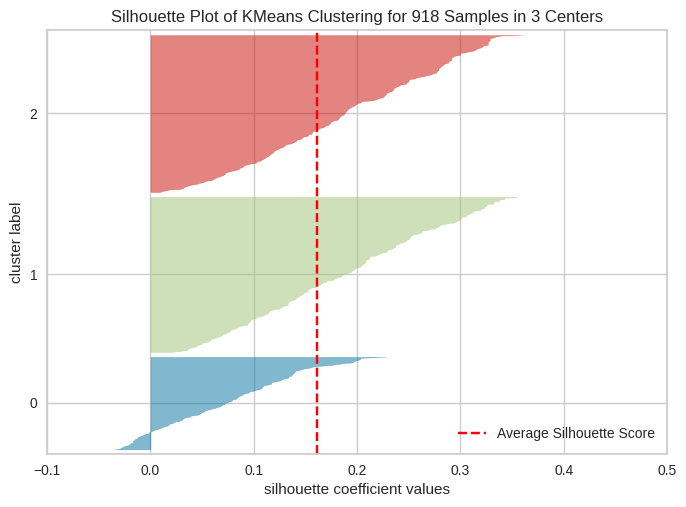

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd  # Import pandas


scaler = StandardScaler()
scaled_data = scaler.fit_transform(scaled_data)

kmeans = KMeans(n_clusters=3, n_init='auto')

# Set the color theme for the visualizer using a valid colormap
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

# Fit the visualizer on the scaled data
visualizer.fit(scaled_data)

# Show the silhouette plot
visualizer.show()

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>  
The silhouette plot for KMeans clustering with 3 centers shows that most data points have positive silhouette scores, indicating they are generally well assigned to their respective clusters and maintain a decent distance from others.

This suggests a **fair level of cluster separation**, with the clustering structure being reasonably clear. However, the existence of some samples with scores near or below zero points to possible **overlap or misclassification**, where a few points may lie closer to neighboring clusters than their assigned ones.


Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score


---



In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

X_scaled = scaled_data

# Perform KMeans clustering with k=3 clusters
kmeans_model = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans_model.fit(X_scaled)
cluster_labels = kmeans_model.labels_

# Calculate WSS
wss_value = kmeans_model.inertia_

# Compute the Silhouette Score for the clusters
avg_silhouette = silhouette_score(X_scaled, cluster_labels)

# Output the WSS and the Silhouette Score
print(f"Within-Cluster Sum of Squares (WSS):" ,wss_value)
print(f"Average Silhouette Score:" , avg_silhouette)


Within-Cluster Sum of Squares (WSS): 6576.0723231369
Average Silhouette Score: 0.1858655312451745


The K-Means clustering with 3 clusters resulted in a **WSS of 6576.07**
and an **Average Silhouette Score of 0.186**.

 This suggests that while the clusters show moderate separation, they are not highly compact or well-defined. The relatively low silhouette score indicates that there may be **some overlap or ambiguity** between clusters, and the clustering solution could potentially be improved by adjusting the number of clusters or exploring alternative clustering methods.

## **K4**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=4
kmeans = KMeans(n_clusters=4, random_state=8953, n_init='auto')  # Set n_init explicitly
kmeans_result= kmeans.fit(scaled_data)

#Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result. labels_)

Cluster Centers:
[[-4.42822203e-01  5.15952417e-01  3.63669197e-01 -2.21743331e-01
   1.29242497e-03 -4.26451583e-01  5.10197971e-01 -6.89047889e-01
  -6.21205764e-01  6.22387196e-01]
 [ 3.20628891e-01  2.60865128e-01 -4.87065285e-01  2.12593074e-01
   3.16239969e-02 -5.51341340e-01 -6.44932572e-01  9.51303834e-01
   6.84486231e-01 -6.55153108e-01]
 [-2.70796156e-01 -1.93816322e+00  4.76775296e-01 -2.22097857e-01
   3.27108456e-01 -3.33503203e-01  5.82032428e-01 -6.76083756e-01
  -4.57568072e-01  5.75005614e-01]
 [ 4.66742840e-01  3.55901397e-01 -2.54186941e-01  2.26269760e-01
  -3.20299920e-01  1.81375843e+00 -3.43058297e-01  2.50719954e-01
   3.63065408e-01 -5.06502480e-01]]

Cluster Labels:
[0 2 0 1 0 0 2 0 1 2 2 1 0 1 2 2 0 2 1 0 2 0 2 1 0 0 1 0 2 0 0 0 1 1 2 0 3
 2 2 1 2 2 0 0 1 1 0 0 0 0 1 1 0 2 1 2 1 0 0 1 0 2 0 1 2 2 2 0 1 0 1 0 0 2
 1 0 0 2 0 0 0 0 1 0 3 1 3 1 0 1 2 0 2 1 2 1 0 0 0 0 1 0 2 3 0 0 2 0 0 0 2
 1 3 0 2 2 0 3 2 0 2 2 0 1 0 0 2 2 2 1 0 1 1 1 1 0 2 0 1 1 1 1 1 0 2 0 0

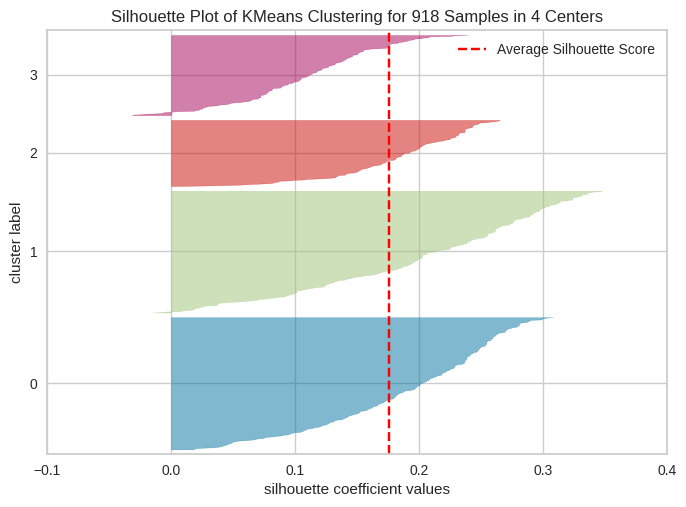

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd  # Import pandas


scaler = StandardScaler()
scaled_data = scaler.fit_transform(scaled_data)

kmeans = KMeans(n_clusters=4, n_init='auto')

# Set the color theme for the visualizer using a valid colormap
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

# Fit the visualizer on the scaled data
visualizer.fit(scaled_data)

# Show the silhouette plot
visualizer.show()

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 918 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>  
The silhouette plot for KMeans clustering with 4 centers shows that most data points have positive silhouette scores, meaning they are generally well grouped within their clusters and moderately separated from others.

However, with an average silhouette score of around 0.2, the overall cluster separation is fairly weak. Some samples fall near zero or even into the negative range, suggesting that a number of data points lie close to cluster boundaries, resulting in **overlap and potential misclassification**. While the clustering isn't poor, it's not particularly strong or well-defined either.


Calculating the Within-Cluster Sum of Squares (WSS) and the Average Silhouette Score


---



In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

X_scaled = scaled_data

# Perform KMeans clustering with k=4 clusters
kmeans_model = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_model.fit(X_scaled)
cluster_labels = kmeans_model.labels_

# Calculate WSS
wss_value = kmeans_model.inertia_

# Compute the Silhouette Score for the clusters
avg_silhouette = silhouette_score(X_scaled, cluster_labels)

# Output the WSS and the Silhouette Score
print(f"Within-Cluster Sum of Squares (WSS):" ,wss_value)
print(f"Average Silhouette Score:" , avg_silhouette)


Within-Cluster Sum of Squares (WSS): 5968.303218123003
Average Silhouette Score: 0.17561137851742672


The K-Means clustering with 4 clusters resulted in a **WSS of 5968.30**
 and an **Average Silhouette Score of 0.176**.

 This indicates a slight improvement in compactness compared to higher WSS values, but the silhouette score remains low. This suggests **moderate separation with possible overlap**, and the clusters are **not highly distinct or well-defined**. Further tuning or alternative clustering methods may be needed for better structure.

# **Review of the Three Clustering Setups:**

**1. WSS: 7257.779, Silhouette Score: 0.199**

Explanation: This setup has the highest silhouette score, meaning the clusters are more clearly separated from each other. However, the high WSS shows that the clusters are not very compact and are more spread out.

**2. WSS: 6576.07, Silhouette Score: 0.186**

Explanation: This option has a lower WSS than the first one, meaning the clusters are a bit tighter. But the silhouette score is also lower, which means the clusters are not as well separated.

**3. WSS: 5968.30, Silhouette Score: 0.176**

Explanation: This setup gives the tightest clusters, as shown by the lowest WSS. Still, it has the lowest silhouette score, which suggests the clusters are not clearly separated.

**Conclusion:**

The first configuration offers the best trade-off. While its clusters are less compact, the higher silhouette score means the groups are more clearly defined. This makes it the most suitable choice for meaningful clustering results.


#**Final Choice:**
### Summary of Results



---
After evaluating the clustering results using WSS (Within-Cluster Sum of Squares) and the average Silhouette score, we found that choosing K = 2 is the most effective option for our model. This is mainly because it yields the highest Silhouette score among all tested values, showing that the clusters are more clearly separated and internally cohesive compared to when K = 3 or K = 4. While the WSS is higher at K = 2—a normal outcome since WSS usually drops as K increases—the strong Silhouette score indicates that K = 2 offers the best balance between cluster compactness and distinction, making it the preferred configuration.
